In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

hotel_list = []
import os
for dirname, _, filenames in os.walk('/kaggle/input/hotel-id-to-combat-human-trafficking-2022-fgvc9/train_images'):
    for filename in filenames:
#         print(os.path.join(dirname, filename))
        hotel_list.append(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
import matplotlib.pyplot as plt
import plotly
from plotly.subplots import make_subplots
from PIL import Image

### Creating a csv that maps Images to Hotels

In [4]:
image_id = []
hotel_id = []

In [5]:
for i in hotel_list:
#     print(str(i.split('/')[-2]))
    image_id.append(str(i.split('/')[-1]))
    hotel_id.append(str(i.split('/')[-2]))

In [6]:
no_of_images_per_hotel = {val: hotel_id.count(val) for val in set(hotel_id)}

In [7]:
no_of_images_per_hotel

{'103254': 8,
 '10766': 11,
 '81693': 7,
 '203965': 5,
 '20287': 6,
 '95506': 8,
 '25962': 11,
 '16461': 20,
 '200555': 4,
 '95461': 11,
 '19902': 4,
 '14474': 25,
 '3084': 7,
 '96526': 8,
 '46261': 20,
 '13863': 8,
 '35039': 4,
 '764': 4,
 '88389': 10,
 '76693': 1393,
 '26959': 4,
 '198245': 20,
 '14710': 5,
 '207268': 12,
 '94067': 12,
 '11357': 4,
 '38500': 4,
 '12941': 4,
 '307872': 4,
 '310679': 8,
 '26116': 8,
 '86115': 8,
 '20909': 8,
 '6516': 8,
 '85622': 8,
 '16761': 15,
 '5867': 8,
 '257725': 15,
 '27520': 11,
 '82008': 4,
 '22612': 12,
 '66698': 8,
 '200983': 4,
 '309500': 4,
 '85874': 8,
 '13620': 8,
 '11260': 8,
 '78758': 12,
 '42109': 12,
 '308707': 4,
 '73885': 12,
 '36573': 13,
 '300431': 8,
 '26587': 56,
 '36556': 8,
 '197790': 12,
 '34149': 4,
 '16677': 10,
 '73247': 14,
 '689443': 41,
 '80751': 8,
 '42443': 8,
 '201139': 2,
 '1013': 4,
 '33036': 12,
 '207165': 4,
 '84426': 18,
 '16810': 8,
 '6311': 25,
 '91300': 6,
 '36238': 40,
 '68564': 7,
 '30892': 12,
 '89607': 1

In [8]:
df = pd.DataFrame(columns=['image_id','hotel_id'])

In [9]:
df['image_id'] = image_id
df['hotel_id'] = hotel_id
df.to_csv('image_to_hotel_mapping.csv',index=False)

In [10]:
df.sample(5)

,image_id,hotel_id
34028,000007817.jpg,13863
25866,000027761.jpg,3135
18194,000025545.jpg,16974
14418,000006153.jpg,308966
9121,000034180.jpg,76926


In [11]:
df[df['hotel_id']=='10010']

,image_id,hotel_id
11017,000019606.jpg,10010
11018,000019601.jpg,10010
11019,000019607.jpg,10010
11020,000019604.jpg,10010
11021,000019603.jpg,10010
11022,000019602.jpg,10010
11023,000019605.jpg,10010
11024,000019608.jpg,10010


### Creating another csv that contains image counts for corresponding hotel id's

In [74]:
df2 = pd.DataFrame(columns=['hotel_id','count'])

In [75]:
lisKey = []
lisVal = []
for key,val in no_of_images_per_hotel.items():
    lisKey.append(key)
    lisVal.append(val)
df2['hotel_id'] = lisKey
df2['count'] = lisVal
df2.to_csv('hotel_to_imagecount_mapping.csv',index=False)

In [76]:
df2.head()

,hotel_id,count
0,10684,21
1,6213,8
2,199664,20
3,103319,16
4,29562,12


## Dataset EDA

In [11]:
print("Number of records: {}".format(len(df)))
print("Number of images: {}".format(df["image_id"].unique().size))
print("Number of hotels: {}".format(df["hotel_id"].unique().size))

Number of records: 44702
Number of images: 44702
Number of hotels: 3116


In [52]:
# Calculate the minimum and maximum number of images per hotel ID
min_images_per_hotel = df.groupby('hotel_id')['image_id'].count().min()
max_images_per_hotel = df.groupby('hotel_id')['image_id'].count().max()

# Calculate the average number of images per hotel ID
average_images_per_hotel = df.groupby('hotel_id')['image_id'].count().mean()

# Calculate the first and third quartile
first_quartile = df['hotel_id'].value_counts().quantile(0.25)
third_quartile = df['hotel_id'].value_counts().quantile(0.75)

# Print the results
print("Minimum number of images per hotel: {}".format(min_images_per_hotel))
print("Maximum number of images per hotel: {}".format(max_images_per_hotel))
print("Average number of images per hotel: {}".format(average_images_per_hotel))
print("First quartile number of images per hotel: {}".format(first_quartile ))
print("Third quartile number of images per hotel: {}".format(third_quartile ))

Minimum number of images per hotel: 1
Maximum number of images per hotel: 1393
Average number of images per hotel: 14.345956354300386
First quartile number of images per hotel: 8.0
Third quartile number of images per hotel: 15.0


## Number of Images per Hotel - visualize

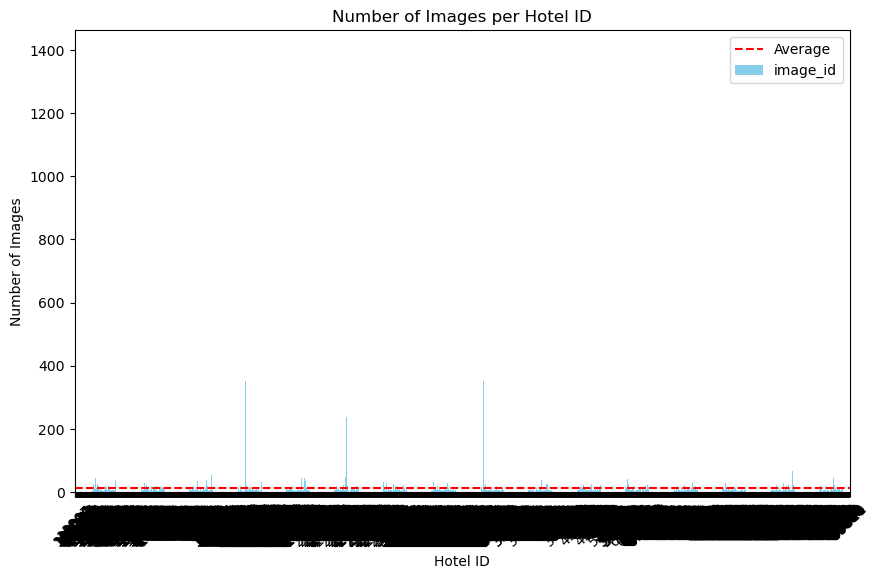

In [13]:
# Calculate the number of images per hotel ID
images_per_hotel = df.groupby('hotel_id')['image_id'].count()

# Calculate statistics
min_images_per_hotel = images_per_hotel.min()
max_images_per_hotel = images_per_hotel.max()
average_images_per_hotel = images_per_hotel.mean()

# Plotting
plt.figure(figsize=(10, 6))
images_per_hotel.plot(kind='bar', color='skyblue')
plt.xlabel('Hotel ID')
plt.ylabel('Number of Images')
plt.title('Number of Images per Hotel ID')
plt.xticks(rotation=45)
plt.axhline(y=average_images_per_hotel, color='red', linestyle='--', label='Average')
plt.legend()
plt.show()

In [14]:
## As above plot has too many values, we visualize the top 100 and bottom 100 hotels based on image count

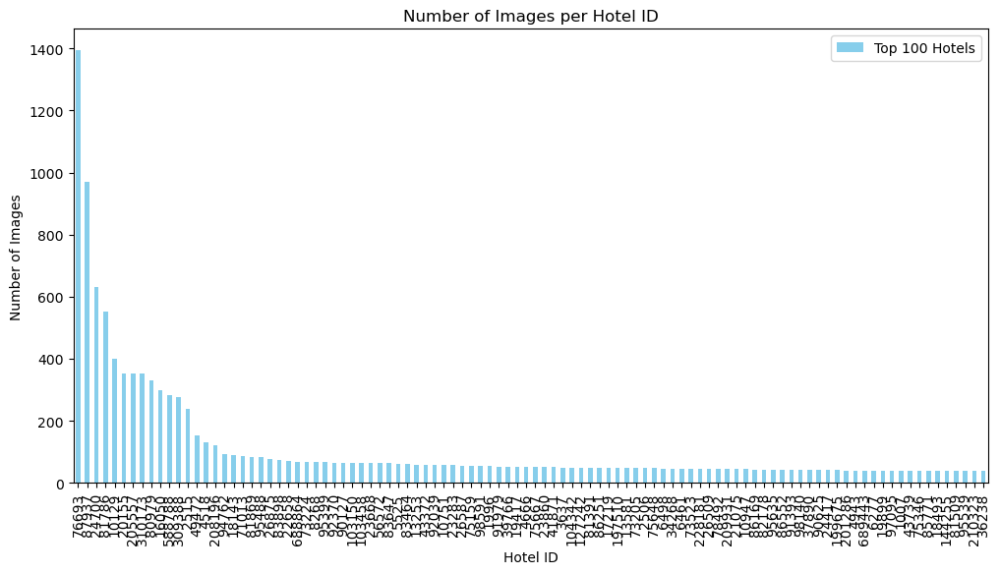

In [49]:
# Calculate the number of images per hotel ID
images_per_hotel = df.groupby('hotel_id')['image_id'].count()

# Sort hotels based on image count
sorted_hotels = images_per_hotel.sort_values(ascending=False)

# Select top 100
top_100_hotels = sorted_hotels.head(100)

# Plotting
plt.figure(figsize=(12, 6))
top_100_hotels.plot(kind='bar',color='skyblue', label='Top 100 Hotels')
plt.xlabel('Hotel ID')
plt.ylabel('Number of Images')
plt.title('Number of Images per Hotel ID')
plt.xticks(rotation=90)
plt.legend()
plt.show()

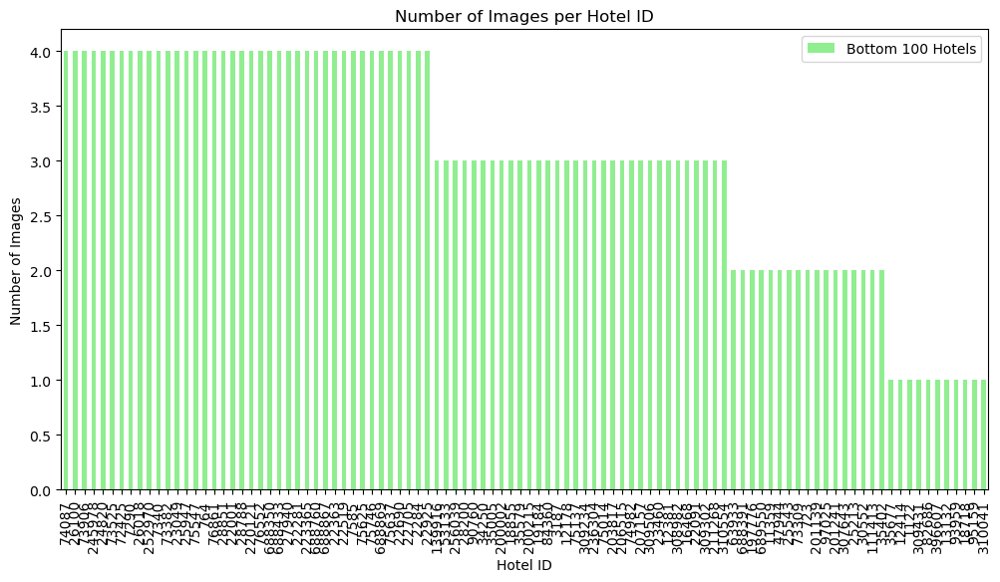

In [48]:
# Calculate the number of images per hotel ID
images_per_hotel = df.groupby('hotel_id')['image_id'].count()

# Sort hotels based on image count
sorted_hotels = images_per_hotel.sort_values(ascending=False)

# Select top 100 and bottom 100 hotels
bottom_100_hotels = sorted_hotels.tail(100)

# Plotting
plt.figure(figsize=(12, 6))
bottom_100_hotels.plot(kind='bar', color='lightgreen', label='Bottom 100 Hotels')
plt.xlabel('Hotel ID')
plt.ylabel('Number of Images')
plt.title('Number of Images per Hotel ID')
plt.xticks(rotation=90)
plt.legend()
plt.show()

## Let's visualize some of the images to understand the type of data we have

In [16]:
def open_image(row_df):
    data_folder = '/kaggle/input/hotel-id-to-combat-human-trafficking-2022-fgvc9'
    return Image.open(f"{data_folder}/train_images/{row_df.hotel_id}/{row_df.image_id}")

In [32]:
def select_data(data_df, hotel_id, N):   
    if hotel_id is not None:
        print("entered hotel id match condition")
        sub_df = data_df[data_df["hotel_id"] == hotel_id]
    else:
        sub_df = data_df
        
    if N is not None:
        sub_df = sub_df.sample(N)
    
    return sub_df

In [18]:
def show_images(data_df, nrows=None, ncols=None, fig_title=None):
    N = len(data_df)
    
    if nrows is None:
        nrows = 1
    if ncols is None:
        ncols = N
    
    fig, axs = plt.subplots(nrows, ncols, figsize=(24,int(5*nrows)))
    if not isinstance(axs, np.ndarray):
        axs = np.array(axs)
        
    axs = axs.ravel()
    
    for i in range(0, N):
        row_df = data_df.iloc[i]
        image = open_image(row_df)
        axs[i].imshow(image)
        axs[i].set_title(f"{row_df.hotel_id}:{row_df.image_id}\n" +  
                          f"Size: {np.shape(image)}")
        axs[i].axis("off")
        
    if fig_title is not None:
        fig.suptitle(fig_title, fontsize=16)

        image_id hotel_id
0  000011648.jpg    15526
1  000011630.jpg    15526
2  000011650.jpg    15526
3  000011633.jpg    15526
4  000011656.jpg    15526


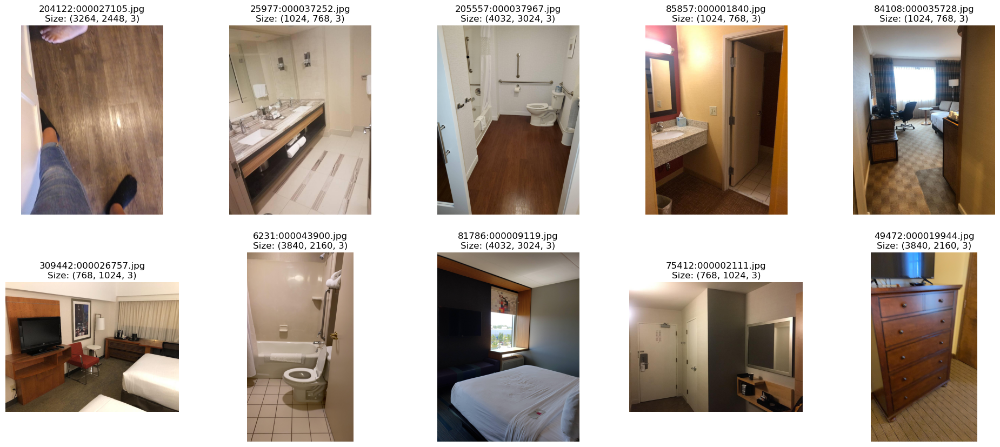

In [19]:
sample_df = select_data(df, None, 10)
show_images(sample_df, 2, 5)

Let's look at images from the same hotel 

entered hotel id match condition


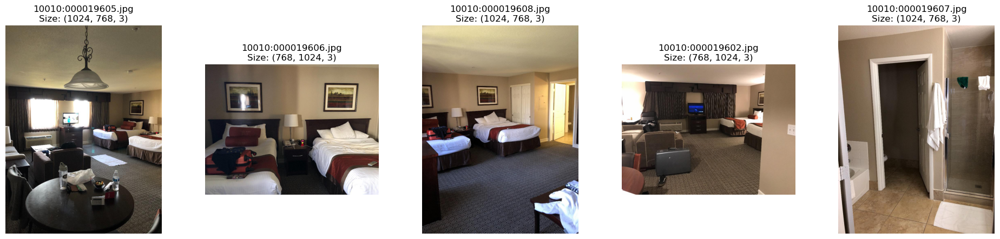

In [34]:
sample_df = select_data(df,'10010',5)
show_images(sample_df, 1, 5)

entered hotel id match condition


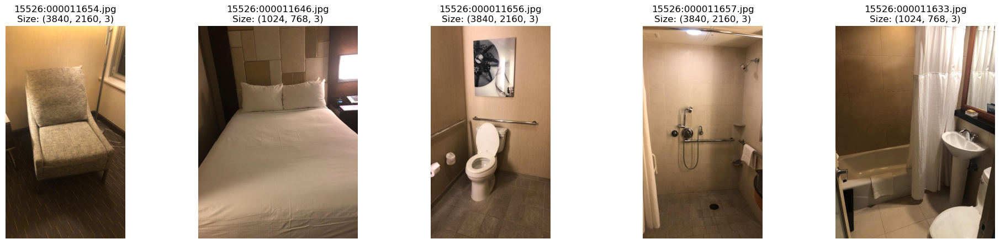

In [35]:
sample_df = select_data(df,'15526',5)
show_images(sample_df, 1, 5)

entered hotel id match condition


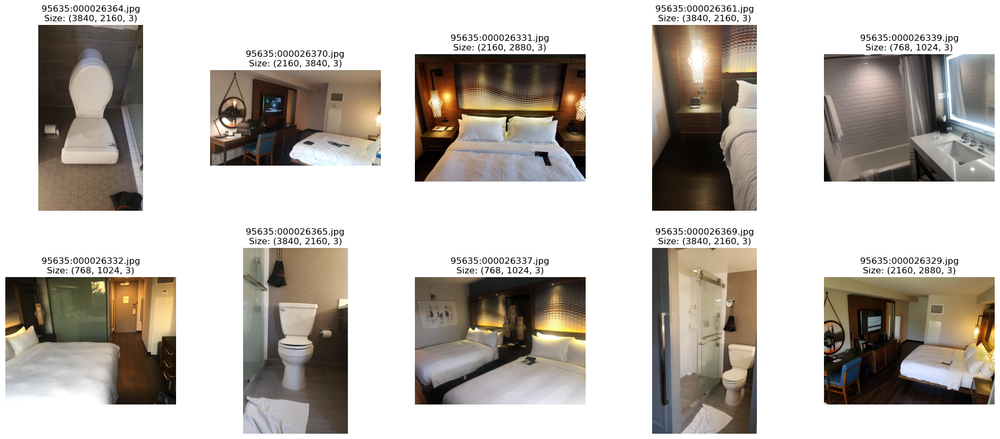

In [36]:
sample_df = select_data(df,'95635',10)
show_images(sample_df, 2, 5)

entered hotel id match condition


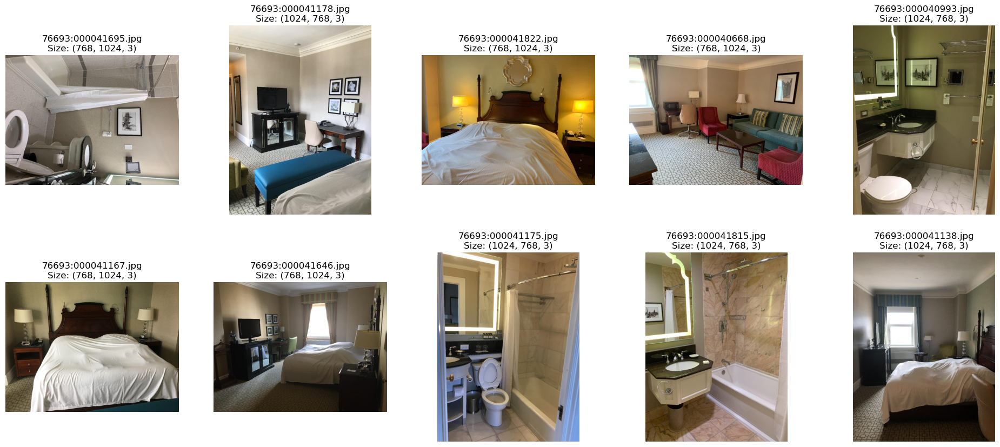

In [53]:
sample_df = select_data(df,'76693',10)
show_images(sample_df, 2, 5)

entered hotel id match condition


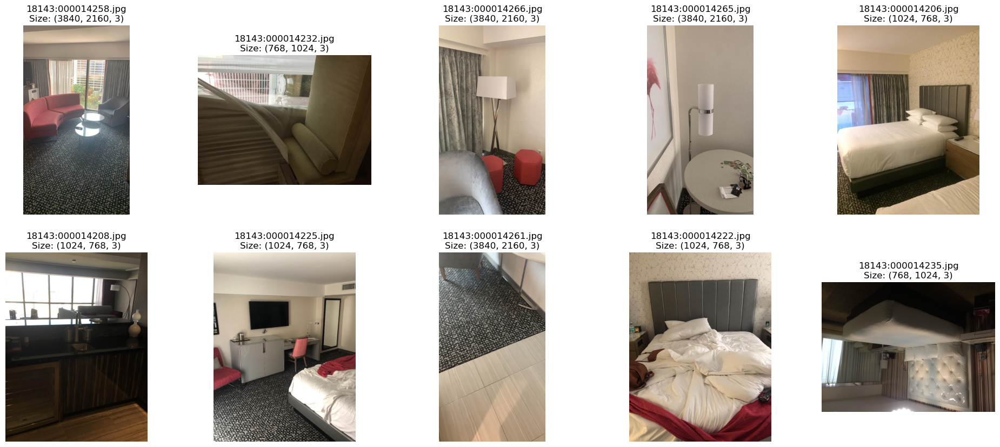

In [66]:
sample_df = select_data(df,'18143',10)
show_images(sample_df, 2, 5)

### Checking the sizes of the images

In [54]:
def get_image_sizes(df):
    image_sizes = []
    for _, row in df.iterrows():
        image = open_image(row)
        size = image.size
        image_sizes.append(size)
        image.close()

    return image_sizes

In [55]:
image_sizes = get_image_sizes(df)

In [60]:
type(image_sizes)

list

In [57]:
# Print the sizes of the images
for i, size in enumerate(image_sizes, 1):
    print(f"Image {i}: {size}")

Image 1: (3840, 2160)
Image 2: (1024, 768)
Image 3: (2160, 3840)
Image 4: (768, 1024)
Image 5: (2160, 3840)
Image 6: (768, 1024)
Image 7: (768, 1024)
Image 8: (768, 1024)
Image 9: (2160, 3840)
Image 10: (1024, 768)
Image 11: (1024, 768)
Image 12: (2160, 3840)
Image 13: (1024, 768)
Image 14: (2160, 3840)
Image 15: (768, 1024)
Image 16: (2160, 3840)
Image 17: (768, 1024)
Image 18: (2160, 3840)
Image 19: (768, 1024)
Image 20: (768, 1024)
Image 21: (768, 1024)
Image 22: (768, 1024)
Image 23: (2160, 3840)
Image 24: (768, 1024)
Image 25: (768, 1024)
Image 26: (1024, 768)
Image 27: (768, 1024)
Image 28: (768, 1024)
Image 29: (2160, 3840)
Image 30: (1024, 768)
Image 31: (3840, 2160)
Image 32: (4032, 3024)
Image 33: (768, 1024)
Image 34: (768, 1024)
Image 35: (3000, 4000)
Image 36: (2160, 2160)
Image 37: (3000, 4000)
Image 38: (768, 1024)
Image 39: (1024, 768)
Image 40: (3264, 1836)
Image 41: (4032, 3024)
Image 42: (1836, 3264)
Image 43: (768, 1024)
Image 44: (4032, 3024)
Image 45: (3000, 4000)

In [58]:
# Get min-max image size
min_image_size = min(image_sizes)
max_image_size = max(image_sizes)
# avg_image_size = sum(image_sizes) / len(image_sizes)

print("Minimum image size:", min_image_size)
print("Maximum image size:", max_image_size)
# print("Average image size:", avg_image_size)

Minimum image size: (484, 1024)
Maximum image size: (13552, 3584)


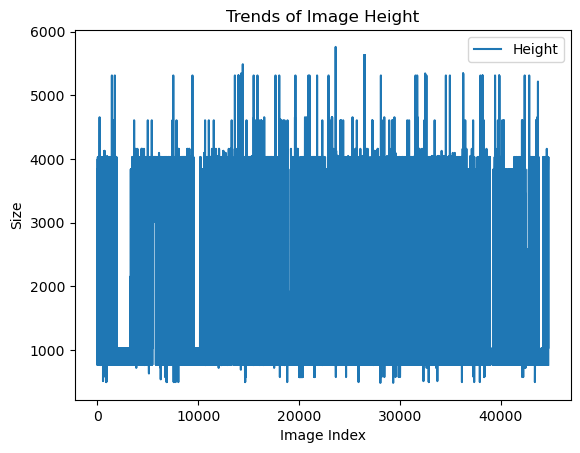

In [64]:
# Extract height  values
heights = [size[1] for size in image_sizes]

# Plotting the trends of image heights and widths
plt.plot(heights, label='Height')
plt.xlabel('Image Index')
plt.ylabel('Size')
plt.title('Trends of Image Height')
plt.legend()
plt.show()

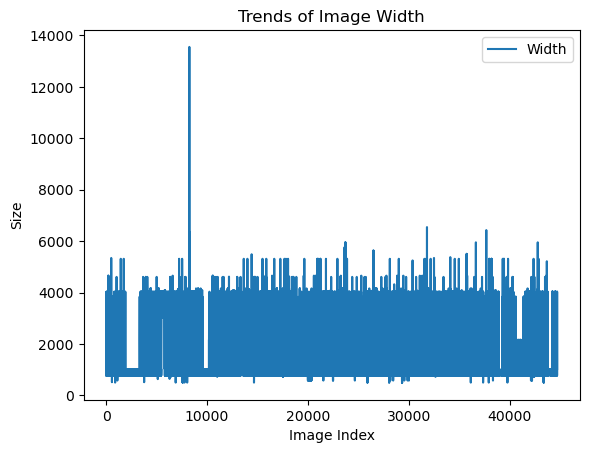

In [65]:
# Extract width values
widths = [size[0] for size in image_sizes]

# Plotting the trends of image widths
plt.plot(widths, label='Width')
plt.xlabel('Image Index')
plt.ylabel('Size')
plt.title('Trends of Image Width')
plt.legend()
plt.show()

In [73]:
# os.remove('/kaggle/working/hotel_to_imagecount_mapping.csv')